# Acknowledgement
code mostly adapted from the sample code of gesture recognizer assignment: [A2: Gesture Recognizer assignment](https://canvas.uw.edu/courses/1199409/assignments/4176980).

# Progress
## Finished
- visualization
- KNN-DTW (achieving 100% accuracy for combined datasets)
- Model based analysis with 1D SVM
- Model based analysis with multi-D SVM
- k-fold validation

## Note: the report is at the end of this document

In [1]:
# installing fastdtw
import sys
!{sys.executable} -m pip install msgpack
!{sys.executable} -m pip install fastdtw

import matplotlib.pyplot as plt # needed for plotting
import numpy as np # numpy is primary library for numeric array (and matrix) handling
from scipy import signal 
import random
from sklearn import svm # need this for svm
import statistics as stats # need this for some features for svm
import itertools # needed for confusion matrix
from sklearn.metrics import confusion_matrix # needed for confusion matrix
from random import randint

You are using pip version 10.0.1, however version 18.0 is available.
You should consider upgrading via the 'pip install --upgrade pip' command.
You are using pip version 10.0.1, however version 18.0 is available.
You should consider upgrading via the 'pip install --upgrade pip' command.


In [2]:
# This cell includes the major classes used in our classification analyses
# Each accelerometer and gyroscope log file gets parsed and made into a SensorData object
class SensorData:
    
    # Constructors in Python look like this (strangely enough)
    # All arguments are numpy arrays except sensorType, which is a str
    def __init__(self, sensorType, currentTimeMs, sensorTimestampNano, x, y, z):
        self.sensorType = sensorType
        
        # On my mac, I could cast as straight-up int but on Windows, this failed
        # This is because on Windows, a long is 32 bit but on Unix, a long is 64bit
        # So, forcing to int64 to be safe. See: https://stackoverflow.com/q/38314118
        self.currentTimeMs = currentTimeMs.astype(np.int64)
        self.sensorTimestampNano = sensorTimestampNano.astype(np.int64)
        
        self.x = x.astype(float)
        self.y = y.astype(float)
        self.z = z.astype(float)
        
   
        # xSquared = np.multiply(self.x , self.x)
        # ySquared = np.multiply(self.y, self.y)
        # zSquared = np.multiply(self.z, self.z)
        # self.mag = np.sqrt(np.add(xSquared, ySquared, zSquared))
        # Fixed April 26, 2018 based on class comment by Krzysztof D.
        self.mag = np.sqrt(self.x**2 + self.y**2 + self.z**2)
        
    # Returns a dict of numpy arrays
    def get_data(self):
        return {"x":self.x, "y":self.y, "z":self.z, "mag":self.mag}
    
    # Pads the end of each data array with zeroes. Throws exception
    # if newArrayLength smaller than the current data array (and thus nothing to pad)
    def pad_with_zeros(self, newArrayLength):
        self.signalLengthBeforePadding = len(self.x)
        arrayLengthDiff = newArrayLength - len(self.x)
        if arrayLengthDiff < 0:
            raise ValueError("New array length '{}' must be larger than current array length '{}".
                             format(newArrayLength, len(self.x)))
        
        # np.pad allows us to pad either the left side, right side, or both sides of an array
        # in this case, we are padding only the right side. See: https://docs.scipy.org/doc/numpy/reference/generated/numpy.pad.html
        self.x = np.pad(self.x, (0, arrayLengthDiff), 'constant', constant_values=0)
        self.y = np.pad(self.y, (0, arrayLengthDiff), 'constant', constant_values=0)
        self.z = np.pad(self.z, (0, arrayLengthDiff), 'constant', constant_values=0)
        self.mag = np.pad(self.mag, (0, arrayLengthDiff), 'constant', constant_values=0)

# A trial is one gesture recording and includes an accel SensorData object and a gyro SensorData object
class Trial:
    
    # We actually parse the sensor log files in the constructor--this is probably bad practice
    # But offers a relatively clean solution
    def __init__(self, gestureName, endTimeMs, trialNum, accelLogFilenameWithPath, gyroLogFilenameWithPath):
        self.gestureName = gestureName
        self.trialNum = trialNum
        self.endTimeMs = endTimeMs
        self.accelLogFilenameWithPath = accelLogFilenameWithPath
        self.gyroLogFilenameWithPath = gyroLogFilenameWithPath
        
        # unpack=True puts each column in its own array, see https://stackoverflow.com/a/20245874
        # I had to force all types to strings because auto-type inferencing failed
        parsedAccelLogData = np.genfromtxt(accelLogFilenameWithPath, delimiter=',', 
                              dtype=str, encoding=None, skip_header=1, unpack=True)
        
        # The asterisk is really cool in Python. It allows us to "unpack" this variable
        # into arguments needed for the SensorData constructor. Google for "tuple unpacking"
        self.accel = SensorData("Accelerometer", *parsedAccelLogData[1:])
        
        parsedGyroLogData = np.genfromtxt(gyroLogFilenameWithPath, delimiter=',', 
                              dtype=str, encoding=None, skip_header=1, unpack=True)
        
        self.gyro = SensorData("Gyroscope", *parsedGyroLogData[1:])
    
    # Utility function that returns the end time as a nice string
    def getEndTimeMsAsString(self):
        return time.strftime('%Y-%m-%d %H:%M:%S', time.localtime(self.endTimeMs / 1000))

In [3]:
# This cell contains our file handling and parsing related functions
from os import listdir
import ntpath
import os

# Returns all csv filenames in the given directory
def find_csv_filenames( path_to_dir, suffix=".csv" ):
    filenames = listdir(path_to_dir)
    return [ filename for filename in filenames if filename.endswith( suffix ) ]

# Parses and creates Trial objects for all csv files in the given dir
# Returns a dict() mapping (str: gestureName) to (list: Trial objects)
def parse_and_create_gesture_trials( path_to_dir ):
    csvFilenames = find_csv_filenames(path_to_dir)
    
    print("Found {} csv files in {}".format(len(csvFilenames), path_to_dir))
    
    mapGestureNameToTrialList = dict()
    mapGestureNameToMapEndTimeMsToMapSensorToFile = dict()
    for csvFilename in csvFilenames:
        # parse filename into meaningful parts
        filenameNoExt = os.path.splitext(csvFilename)[0];
        filenameParts = filenameNoExt.split("_")
        gestureName = filenameParts[0]
        sensorName = filenameParts[1]
        timeMs = int(filenameParts[2])
        
        # print("gestureName={} sensorName={} timeMs={}".format(gestureName, sensorName, timeMs))
        
        if gestureName not in mapGestureNameToMapEndTimeMsToMapSensorToFile:
            mapGestureNameToMapEndTimeMsToMapSensorToFile[gestureName] = dict()
        
        if timeMs not in mapGestureNameToMapEndTimeMsToMapSensorToFile[gestureName]:
            mapGestureNameToMapEndTimeMsToMapSensorToFile[gestureName][timeMs] = dict()
        
        mapGestureNameToMapEndTimeMsToMapSensorToFile[gestureName][timeMs][sensorName] = csvFilename
        # print (mapGestureNameToMapEndTimeMsToMapSensorToFile)
    
    print("Found {} gestures".format(len(mapGestureNameToMapEndTimeMsToMapSensorToFile)))
    
    # track the longest array so we can resize accordingly (by padding with zeros currently)
    maxArrayLength = -1
    trialWithMostSensorEvents = None
    
    # Now we need to loop through the data and sort each gesture set by timems values 
    # (so that we have trial 1, 2, 3, etc.)
    for gestureName, mapEndTimeMsToMapSensorToFile in mapGestureNameToMapEndTimeMsToMapSensorToFile.items():
        gestureTrialNum = 0
        mapGestureNameToTrialList[gestureName] = list()
        for endTimeMs in sorted(mapEndTimeMsToMapSensorToFile.keys()):
            mapSensorToFile = mapEndTimeMsToMapSensorToFile[endTimeMs]
            
            accelFilenameWithPath = os.path.join(path_to_dir, mapSensorToFile["Accelerometer"])
            gyroFilenameWithPath = os.path.join(path_to_dir, mapSensorToFile["Gyroscope"])
            
            gestureTrial = Trial(gestureName, endTimeMs, gestureTrialNum, accelFilenameWithPath, gyroFilenameWithPath)
            mapGestureNameToTrialList[gestureName].append(gestureTrial)
            
            if maxArrayLength < len(gestureTrial.accel.x):
                maxArrayLength = len(gestureTrial.accel.x)
                trialWithMostSensorEvents = gestureTrial
            
            gestureTrialNum = gestureTrialNum + 1
        
        print("Found {} trials for '{}'".format(len(mapGestureNameToTrialList[gestureName]), gestureName))
    
    # Some basic preprocessing
    # Resize arrays so everything is same length (necessary for shape matching) 
    print("Max trial length across all gesture is '{}' Trial {} with {} sensor events. Resizing all arrays to match".
          format(trialWithMostSensorEvents.gestureName, trialWithMostSensorEvents.trialNum, maxArrayLength))
    for gestureName, trialList in mapGestureNameToTrialList.items():
        for trial in trialList: 
            trial.accel.pad_with_zeros(maxArrayLength)
            trial.gyro.pad_with_zeros(maxArrayLength)
          
    return mapGestureNameToTrialList
        
# Returns the leafs in a path
# From: https://stackoverflow.com/a/8384788
def path_leaf(path):
    head, tail = ntpath.split(path)
    return tail or ntpath.basename(head)

# Utility function to extract gesture name from filename
def extract_gesture_name( filename ):
    # leaf = path_leaf(filename)
    tokenSplitPos = filename.index('_')
    gestureName = filename[:tokenSplitPos]
    return gestureName

# Returns the minimum number of trials across all gestures (just in case we accidentally recorded a 
# different number. We should have 5 or 10 each for the A2 assignment)
def get_min_num_of_trials( mapGestureToTrials ):
    minNumTrials = -1 
    for gestureName, trialSet in mapGestureToTrials.items():
        if minNumTrials == -1 or minNumTrials > len(trialSet):
            minNumTrials = len(trialSet)
    return minNumTrials

# returns the total number of trials
def get_total_num_of_trials (mapGestureToTrials):
    numTrials = 0 
    for gestureName, trialSet in mapGestureToTrials.items():
        numTrials = numTrials + len(trialSet)
    return numTrials

In [4]:
# Load the data

# You should change the path to the location of the log files on your system
# logPath = '/Users/jonf/Dropbox/CSE590_UbiComp/Git/CSE590Sp2018p/A02-GestureRecognizer/JupyterAnalysis/GestureLogs'
# logPath = "D:\Dropbox\CSE590_UbiComp\Git\CSE590Sp2018\A02-GestureRecognizer\JonGestureLogs"

# my_logPath = './haoliGestureLogs'
# mapGestureToTrials = parse_and_create_gesture_trials(my_logPath)

my_logPath = './haoliGestureLogs'
mapGestureToTrials = parse_and_create_gesture_trials(my_logPath)

Found 120 csv files in ./haoliGestureLogs
Found 12 gestures
Found 5 trials for 'The Killing Curse'
Found 5 trials for 'Midair Counter Clockwise O'
Found 5 trials for 'At Rest'
Found 5 trials for 'Baseball Throw'
Found 5 trials for 'Forehand Tennis'
Found 5 trials for 'Midair Clockwise O'
Found 5 trials for 'Midair S'
Found 5 trials for 'Backhand Tennis'
Found 5 trials for 'The Killing Curse Slow'
Found 5 trials for 'Underhand Bowling'
Found 5 trials for 'Shake'
Found 5 trials for 'Midair Zorro Z'
Max trial length across all gesture is 'At Rest' Trial 4 with 193 sensor events. Resizing all arrays to match


# Visualization

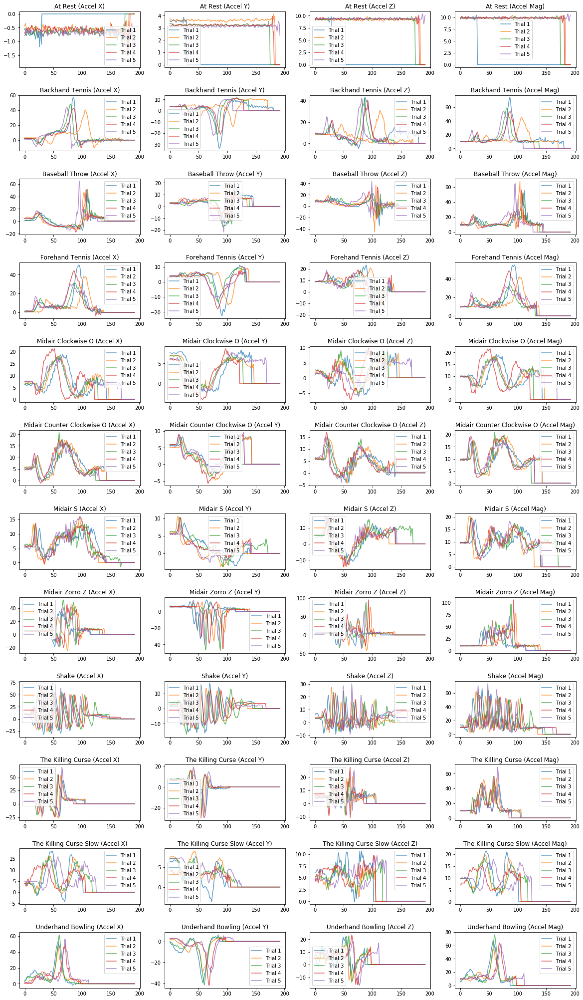

In [30]:
# Visualizing my data - accelerometer
# Now let's plot all of the accel signals! :)

# We are going to make a grid of line graphs with a row for each gesture, so len(mapGestureToTrials) rows
# and a column for each signal type, so 4 columns (one for x, y, z, and mag)
fig, axes = plt.subplots(len(mapGestureToTrials), 4, figsize=(20, 3 * len(mapGestureToTrials)))
fig.subplots_adjust(hspace=0.5)

index = 0
gestureNamesSorted = sorted(mapGestureToTrials.keys())
for gestureName in gestureNamesSorted:
    gestureTrials = mapGestureToTrials[gestureName]
    
    trialNum = 1
    for trial in gestureTrials:
        axes[index][0].plot(trial.accel.x, alpha=0.7, label="Trial {}".format(trialNum))
        axes[index][1].plot(trial.accel.y, alpha=0.7, label="Trial {}".format(trialNum))
        axes[index][2].plot(trial.accel.z, alpha=0.7, label="Trial {}".format(trialNum))
        axes[index][3].plot(trial.accel.mag, alpha=0.7, label="Trial {}".format(trialNum))
        trialNum = trialNum + 1
        
    axes[index][0].set_title(gestureName + " (Accel X)")
    axes[index][0].legend()
    
    axes[index][1].set_title(gestureName + " (Accel Y)")
    axes[index][1].legend()
    
    axes[index][2].set_title(gestureName + " (Accel Z)")
    axes[index][2].legend()
    
    axes[index][3].set_title(gestureName + " (Accel Mag)")
    axes[index][3].legend()
    index = index + 1


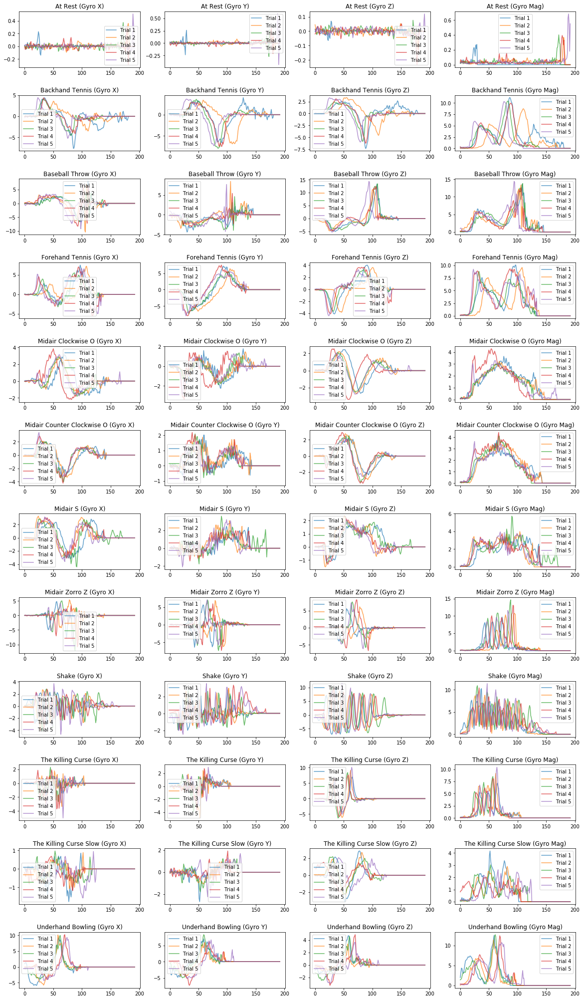

In [31]:
# Visualizing my data - gyroscope
# Now let's plot all of the accel signals! :)

# We are going to make a grid of line graphs with a row for each gesture, so len(mapGestureToTrials) rows
# and a column for each signal type, so 4 columns (one for x, y, z, and mag)
fig, axes = plt.subplots(len(mapGestureToTrials), 4, figsize=(20, 3 * len(mapGestureToTrials)))
fig.subplots_adjust(hspace=0.5)

index = 0
gestureNamesSorted = sorted(mapGestureToTrials.keys())
for gestureName in gestureNamesSorted:
    gestureTrials = mapGestureToTrials[gestureName]
    
    trialNum = 1
    for trial in gestureTrials:
        axes[index][0].plot(trial.gyro.x, alpha=0.7, label="Trial {}".format(trialNum))
        axes[index][1].plot(trial.gyro.y, alpha=0.7, label="Trial {}".format(trialNum))
        axes[index][2].plot(trial.gyro.z, alpha=0.7, label="Trial {}".format(trialNum))
        axes[index][3].plot(trial.gyro.mag, alpha=0.7, label="Trial {}".format(trialNum))
        trialNum = trialNum + 1
        
    axes[index][0].set_title(gestureName + " (Gyro X)")
    axes[index][0].legend()
    
    axes[index][1].set_title(gestureName + " (Gyro Y)")
    axes[index][1].legend()
    
    axes[index][2].set_title(gestureName + " (Gyro Z)")
    axes[index][2].legend()
    
    axes[index][3].set_title(gestureName + " (Gyro Mag)")
    axes[index][3].legend()
    index = index + 1

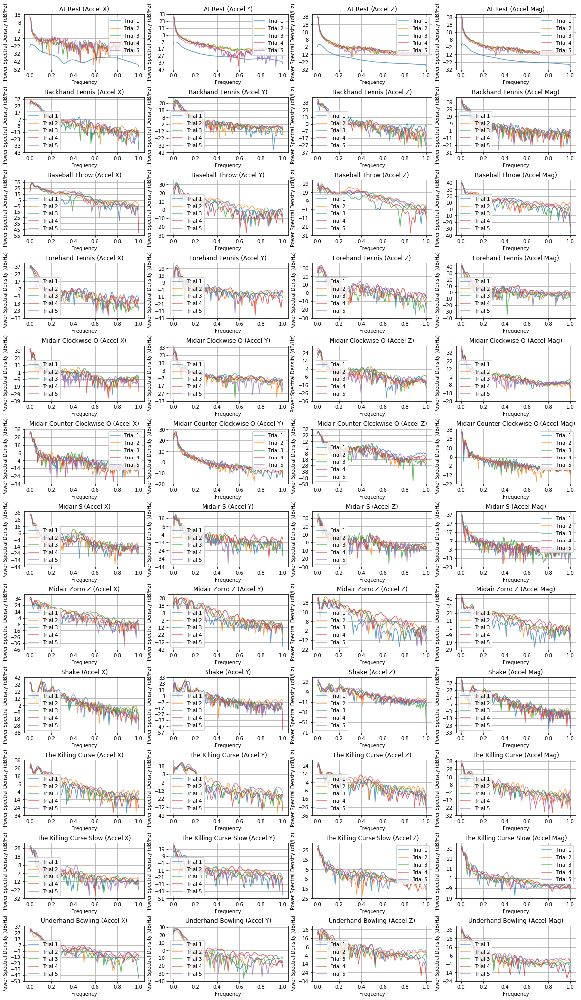

In [32]:
# Visualizing my data - spectral density plot of accelerometer
fig, axes = plt.subplots(len(mapGestureToTrials), 4, figsize=(20, 3 * len(mapGestureToTrials)))
fig.subplots_adjust(hspace=0.5)

index = 0
gestureNamesSorted = sorted(mapGestureToTrials.keys())
for gestureName in gestureNamesSorted:
    gestureTrials = mapGestureToTrials[gestureName]
    
    trialNum = 1
    for trial in gestureTrials:
        axes[index][0].psd(trial.accel.x, alpha=0.7, label="Trial {}".format(trialNum))
#         axes[index][0].specgram(trial.accel.x, alpha=0.7, label="Trial {}".format(trialNum))
        axes[index][1].psd(trial.accel.y, alpha=0.7, label="Trial {}".format(trialNum))
        axes[index][2].psd(trial.accel.z, alpha=0.7, label="Trial {}".format(trialNum))
        axes[index][3].psd(trial.accel.mag, alpha=0.7, label="Trial {}".format(trialNum))
        trialNum = trialNum + 1
        
    axes[index][0].set_title(gestureName + " (Accel X)")
    axes[index][0].legend()
    
    axes[index][1].set_title(gestureName + " (Accel Y)")
    axes[index][1].legend()
    
    axes[index][2].set_title(gestureName + " (Accel Z)")
    axes[index][2].legend()
    
    axes[index][3].set_title(gestureName + " (Accel Mag)")
    axes[index][3].legend()
    index = index + 1

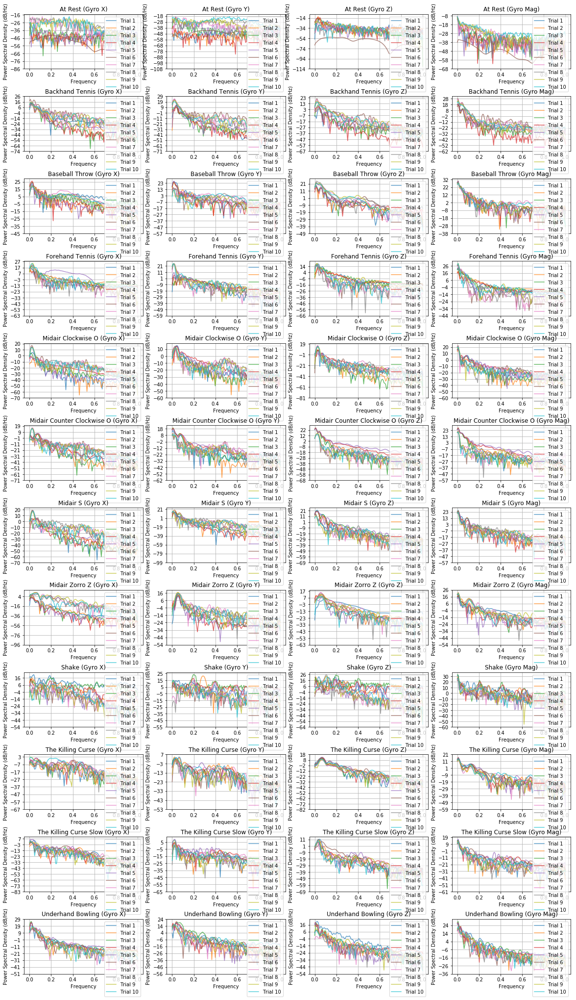

In [8]:
# Visualizing my data - spectral density plot of gyroscope
fig, axes = plt.subplots(len(mapGestureToTrials), 4, figsize=(20, 3 * len(mapGestureToTrials)))
fig.subplots_adjust(hspace=0.5)

index = 0
gestureNamesSorted = sorted(mapGestureToTrials.keys())
for gestureName in gestureNamesSorted:
    gestureTrials = mapGestureToTrials[gestureName]
    
    trialNum = 1
    for trial in gestureTrials:
        axes[index][0].psd(trial.gyro.x, alpha=0.7, label="Trial {}".format(trialNum))
#         axes[index][0].specgram(trial.accel.x, alpha=0.7, label="Trial {}".format(trialNum))
        axes[index][1].psd(trial.gyro.y, alpha=0.7, label="Trial {}".format(trialNum))
        axes[index][2].psd(trial.gyro.z, alpha=0.7, label="Trial {}".format(trialNum))
        axes[index][3].psd(trial.gyro.mag, alpha=0.7, label="Trial {}".format(trialNum))
        trialNum = trialNum + 1
        
    axes[index][0].set_title(gestureName + " (Gyro X)")
    axes[index][0].legend()
    
    axes[index][1].set_title(gestureName + " (Gyro Y)")
    axes[index][1].legend()
    
    axes[index][2].set_title(gestureName + " (Gyro Z)")
    axes[index][2].legend()
    
    axes[index][3].set_title(gestureName + " (Gyro Mag)")
    axes[index][3].legend()
    index = index + 1

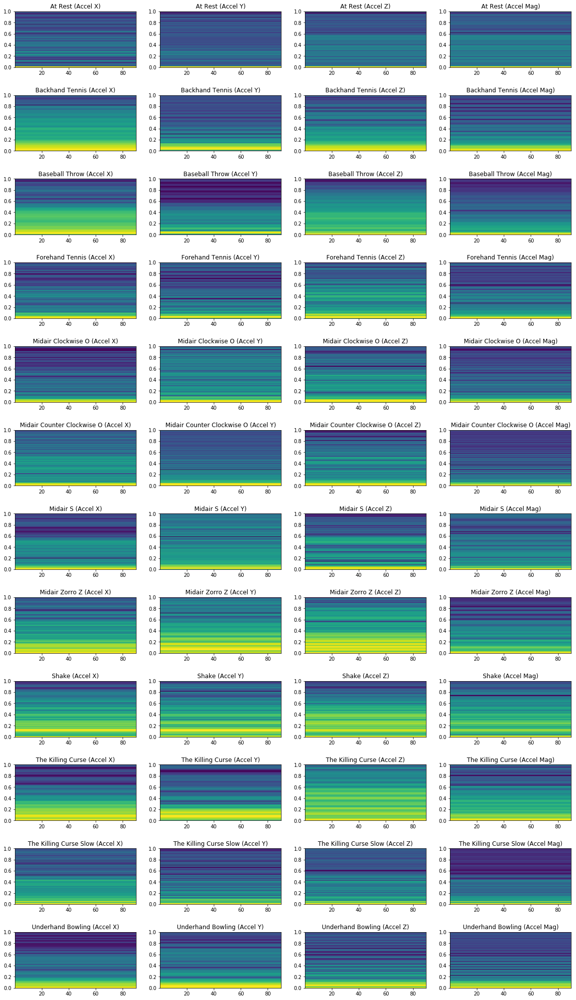

In [36]:
# visualization part 3
# Visualizing my data - spectrogram of accelerometer (which is a little difficult to read and compare)
fig, axes = plt.subplots(len(mapGestureToTrials), 4, figsize=(20, 3 * len(mapGestureToTrials)))
fig.subplots_adjust(hspace=0.5)

index = 0
gestureNamesSorted = sorted(mapGestureToTrials.keys())
for gestureName in gestureNamesSorted:
    gestureTrials = mapGestureToTrials[gestureName]
    
    trialNum = 1
    for trial in gestureTrials:
        axes[index][0].specgram(trial.accel.x, NFFT=180, Fs=2, noverlap=1)
        axes[index][1].specgram(trial.accel.y, NFFT=180, Fs=2, noverlap=1)
        axes[index][2].specgram(trial.accel.z, NFFT=180, Fs=2, noverlap=1)
        axes[index][3].specgram(trial.accel.mag, NFFT=180, Fs=2, noverlap=1)
        trialNum = trialNum + 1
        
    axes[index][0].set_title(gestureName + " (Accel X)")
    # axes[index][0].legend()
    
    axes[index][1].set_title(gestureName + " (Accel Y)")
    # axes[index][1].legend()
    
    axes[index][2].set_title(gestureName + " (Accel Z)")
#     axes[index][2].legend()
    
    axes[index][3].set_title(gestureName + " (Accel Mag)")
#     axes[index][3].legend()
    index = index + 1


Found 100 csv files in ./JonGestureLogs
Found 10 gestures
Found 5 trials for 'Backhand Tennis'
Found 5 trials for 'Midair Clockwise O'
Found 5 trials for 'At Rest'
Found 5 trials for 'Midair Zorro Z'
Found 5 trials for 'Shake'
Found 5 trials for 'Underhand Bowling'
Found 5 trials for 'Midair S'
Found 5 trials for 'Midair Counter Clockwise O'
Found 5 trials for 'Baseball Throw'
Found 5 trials for 'Forehand Tennis'
Max trial length across all gesture is 'At Rest' Trial 3 with 323 sensor events. Resizing all arrays to match


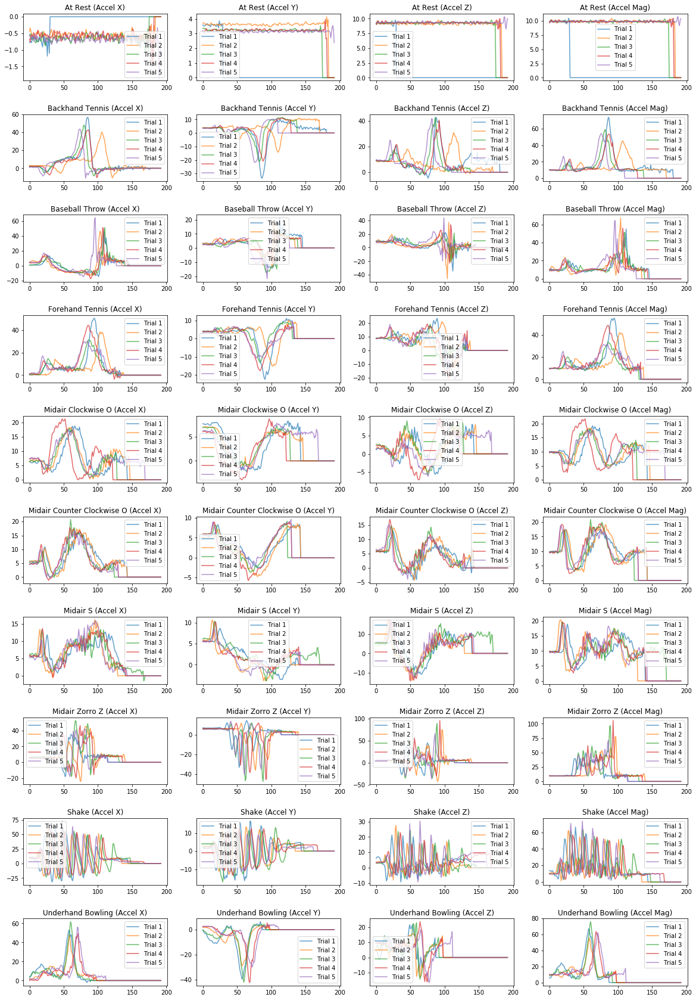

In [37]:
#Visualizing jon's data - accelerometer
jon_logPath = './JonGestureLogs'
jonMapGestureToTrials = parse_and_create_gesture_trials(jon_logPath)


fig, axes = plt.subplots(len(jonMapGestureToTrials), 4, figsize=(20, 3 * len(jonMapGestureToTrials)))
fig.subplots_adjust(hspace=0.5)

index = 0
gestureNamesSorted = sorted(jonMapGestureToTrials.keys())
for gestureName in gestureNamesSorted:
    gestureTrials = mapGestureToTrials[gestureName]
    
    trialNum = 1
    for trial in gestureTrials:
        axes[index][0].plot(trial.accel.x, alpha=0.7, label="Trial {}".format(trialNum))
        axes[index][1].plot(trial.accel.y, alpha=0.7, label="Trial {}".format(trialNum))
        axes[index][2].plot(trial.accel.z, alpha=0.7, label="Trial {}".format(trialNum))
        axes[index][3].plot(trial.accel.mag, alpha=0.7, label="Trial {}".format(trialNum))
        trialNum = trialNum + 1
        
    axes[index][0].set_title(gestureName + " (Accel X)")
    axes[index][0].legend()
    
    axes[index][1].set_title(gestureName + " (Accel Y)")
    axes[index][1].legend()
    
    axes[index][2].set_title(gestureName + " (Accel Z)")
    axes[index][2].legend()
    
    axes[index][3].set_title(gestureName + " (Accel Mag)")
    axes[index][3].legend()
    index = index + 1

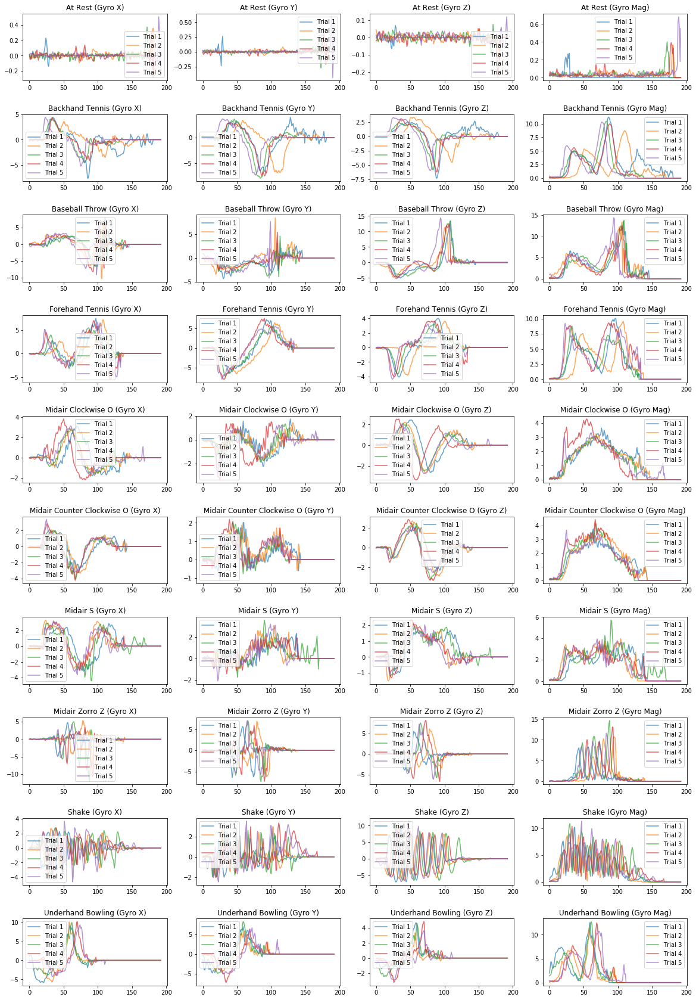

In [38]:
#Visualizing jon's data - gyroscope
fig, axes = plt.subplots(len(jonMapGestureToTrials), 4, figsize=(20, 3 * len(jonMapGestureToTrials)))
fig.subplots_adjust(hspace=0.5)

index = 0
gestureNamesSorted = sorted(jonMapGestureToTrials.keys())
for gestureName in gestureNamesSorted:
    gestureTrials = mapGestureToTrials[gestureName]
    
    trialNum = 1
    for trial in gestureTrials:
        axes[index][0].plot(trial.gyro.x, alpha=0.7, label="Trial {}".format(trialNum))
        axes[index][1].plot(trial.gyro.y, alpha=0.7, label="Trial {}".format(trialNum))
        axes[index][2].plot(trial.gyro.z, alpha=0.7, label="Trial {}".format(trialNum))
        axes[index][3].plot(trial.gyro.mag, alpha=0.7, label="Trial {}".format(trialNum))
        trialNum = trialNum + 1
        
    axes[index][0].set_title(gestureName + " (Gyro X)")
    axes[index][0].legend()
    
    axes[index][1].set_title(gestureName + " (Gyro Y)")
    axes[index][1].legend()
    
    axes[index][2].set_title(gestureName + " (Gyro Z)")
    axes[index][2].legend()
    
    axes[index][3].set_title(gestureName + " (Gyro Mag)")
    axes[index][3].legend()
    index = index + 1

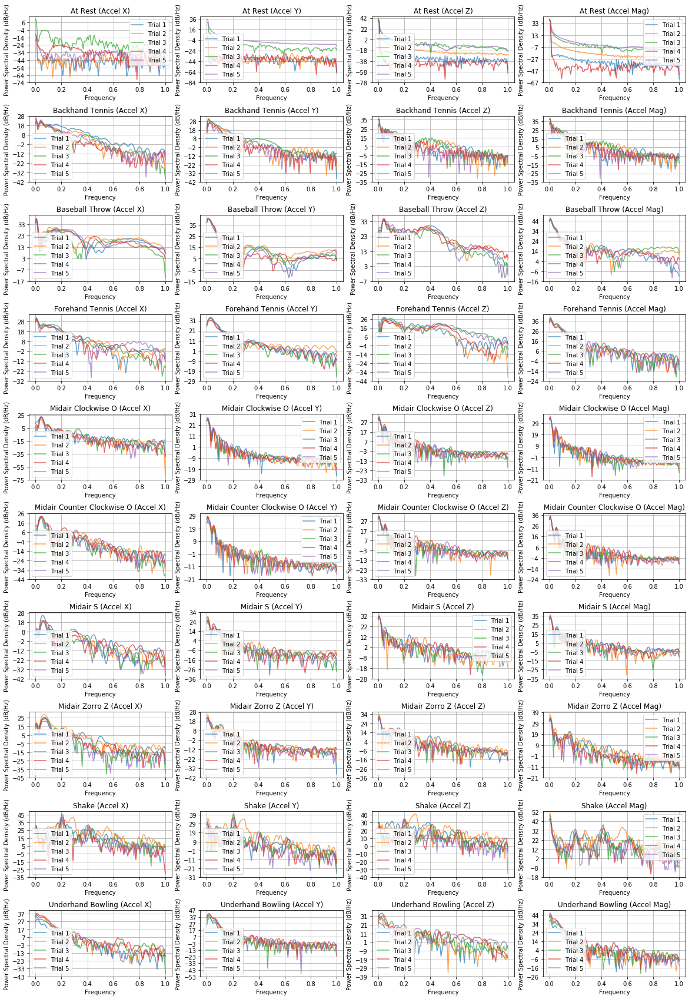

In [39]:
# Visualizing Jon data - spectral density plot of accelerometer
fig, axes = plt.subplots(len(jonMapGestureToTrials), 4, figsize=(20, 3 * len(jonMapGestureToTrials)))
fig.subplots_adjust(hspace=0.5)

index = 0
gestureNamesSorted = sorted(jonMapGestureToTrials.keys())
for gestureName in gestureNamesSorted:
    gestureTrials = jonMapGestureToTrials[gestureName]
    
    trialNum = 1
    for trial in gestureTrials:
        axes[index][0].psd(trial.accel.x, alpha=0.7, label="Trial {}".format(trialNum))
        axes[index][1].psd(trial.accel.y, alpha=0.7, label="Trial {}".format(trialNum))
        axes[index][2].psd(trial.accel.z, alpha=0.7, label="Trial {}".format(trialNum))
        axes[index][3].psd(trial.accel.mag, alpha=0.7, label="Trial {}".format(trialNum))
        trialNum = trialNum + 1
        
    axes[index][0].set_title(gestureName + " (Accel X)")
    axes[index][0].legend()
    
    axes[index][1].set_title(gestureName + " (Accel Y)")
    axes[index][1].legend()
    
    axes[index][2].set_title(gestureName + " (Accel Z)")
    axes[index][2].legend()
    
    axes[index][3].set_title(gestureName + " (Accel Mag)")
    axes[index][3].legend()
    index = index + 1

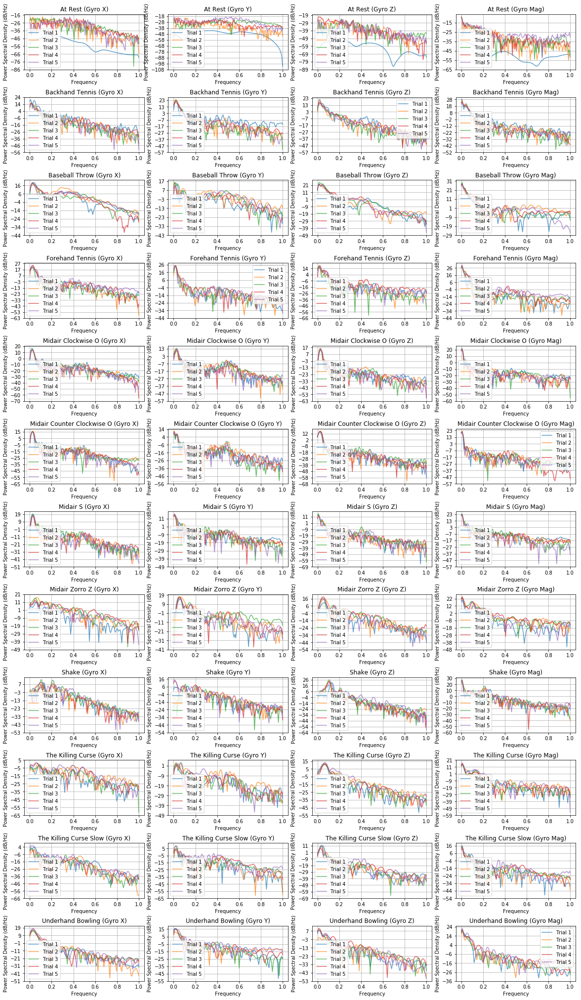

In [40]:
# Visualizing jon's data - spectral density plot of gyroscope
fig, axes = plt.subplots(len(mapGestureToTrials), 4, figsize=(20, 3 * len(mapGestureToTrials)))
fig.subplots_adjust(hspace=0.5)

index = 0
gestureNamesSorted = sorted(mapGestureToTrials.keys())
for gestureName in gestureNamesSorted:
    gestureTrials = mapGestureToTrials[gestureName]
    
    trialNum = 1
    for trial in gestureTrials:
        axes[index][0].psd(trial.gyro.x, alpha=0.7, label="Trial {}".format(trialNum))
#         axes[index][0].specgram(trial.accel.x, alpha=0.7, label="Trial {}".format(trialNum))
        axes[index][1].psd(trial.gyro.y, alpha=0.7, label="Trial {}".format(trialNum))
        axes[index][2].psd(trial.gyro.z, alpha=0.7, label="Trial {}".format(trialNum))
        axes[index][3].psd(trial.gyro.mag, alpha=0.7, label="Trial {}".format(trialNum))
        trialNum = trialNum + 1
        
    axes[index][0].set_title(gestureName + " (Gyro X)")
    axes[index][0].legend()
    
    axes[index][1].set_title(gestureName + " (Gyro Y)")
    axes[index][1].legend()
    
    axes[index][2].set_title(gestureName + " (Gyro Z)")
    axes[index][2].legend()
    
    axes[index][3].set_title(gestureName + " (Gyro Mag)")
    axes[index][3].legend()
    index = index + 1

In [12]:
# In class on Thursday, April 12, I'd like you to start analyzing and comparing these gesture signals.
# Think about:
#  - What kind of filtering might be useful?
#  - What kind of signal transforms? (e.g., ffts)
#  - Is there value in exploring both the accel data AND the gyro data? 
#  - What is the simplest way we can compare two signals? (scroll down and look for distance.euclidean)?
#  - What classes might you want to create to help you keep things organized? (e.g., your k-fold experiments and results)

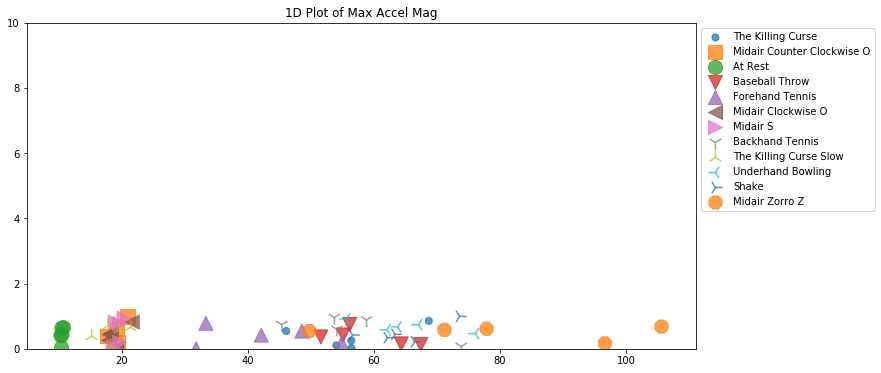

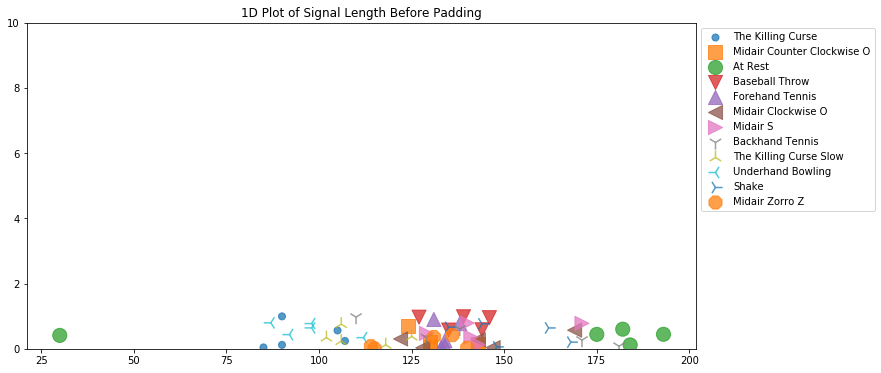

In [41]:
# Playing around with 1D Explorations of data
# TODO: brainstorm and experiment with at least five features that you think might be highly differentiable in the 
# gesture dataset. I've started by plotting two simple features: the maximum magnitude and the length of the trial

# tried:

import itertools

mapMarkerToDesc = {
    ".":"point",
    ",":"pixel",
    "o":"circle",
    "v":"triangle_down",
    "^":"triangle_up",
    "<":"triangle_left",
    ">":"triangle_right",
    "1":"tri_down",
    "2":"tri_up",
    "3":"tri_left",
    "4":"tri_right",
    "8":"octagon",
    "s":"square",
    "p":"pentagon",
    "*":"star",
    "h":"hexagon1",
    "H":"hexagon2",
    "+":"plus",
    "D":"diamond",
    "d":"thin_diamond",
    "|":"vline",
    "_":"hline"
}

# Plots the maximum magnitude of each trial's acceleration signal
markers = list(mapMarkerToDesc.keys())
marker = itertools.cycle(markers)
plt.figure(figsize=(12, 6))
for gestureName, trials in mapGestureToTrials.items():
    x = list(trial.accel.mag.max() for trial in trials)
#     trying different axis
#     x = list(trial.accel.y.max() for trial in trials)
#     x = list(stats.stdev(trial.accel.mag) for trial in trials)
    y = np.random.rand(len(x))
    s = [200] * len(x)
    plt.scatter(x, y, alpha=0.75, marker=next(marker), s=s, label=gestureName)

plt.ylim((0,10))
plt.legend(loc='upper left', bbox_to_anchor=(1,1))    
plt.title("1D Plot of Max Accel Mag")
plt.show()


# Plots the length of each gesture trial
markers = list(mapMarkerToDesc.keys())
marker = itertools.cycle(markers)
plt.figure(figsize=(12, 6))
for gestureName, trials in mapGestureToTrials.items():
    x = list(trial.accel.signalLengthBeforePadding for trial in trials)
    y = np.random.rand(len(x))
    s = [200] * len(x)
    plt.scatter(x, y, alpha=0.75, marker=next(marker), s=s, label=gestureName)

plt.ylim((0,10))
plt.legend(loc='upper left', bbox_to_anchor=(1,1))    
plt.title("1D Plot of Signal Length Before Padding")
plt.show()

# Add your own down here!


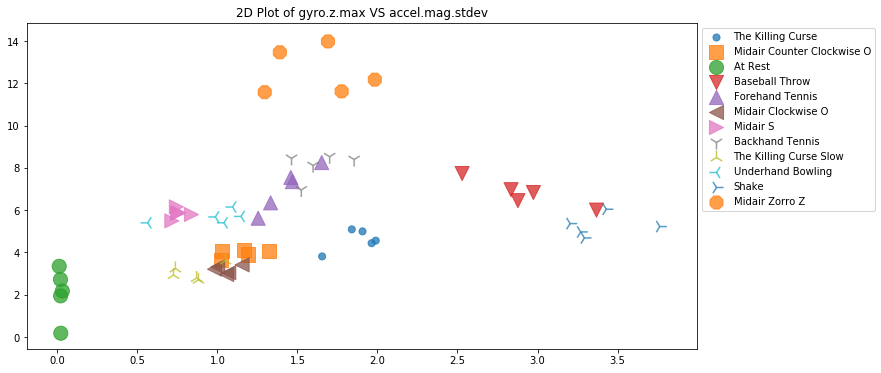

In [42]:
# Now explore the discriminability of 2 dimensions!
# For this exercise, you're going to explore these features in 2D by combining them. Please wait
# to complete this exercise until we get to it in class
# I purposefully did not give you skeleton code here. Please copy/paste a section from the above cell
# and adapt it to plot two features at a time in a scatter plot
import itertools
import statistics as stats

# 2D Plot 1
markers = list(mapMarkerToDesc.keys())
marker = itertools.cycle(markers)
plt.figure(figsize=(12, 6))
for gestureName, trials in mapGestureToTrials.items():
#     x = list(trial.gyro.y.max() for trial in trials) 
    x = list(stats.stdev(trial.gyro.z) for trial in trials)
    y = list(stats.stdev(trial.accel.z) for trial in trials)
    s = [200] * len(x)
    plt.scatter(x, y, alpha=0.75, marker=next(marker), s=s, label=gestureName)

plt.legend(loc='upper left', bbox_to_anchor=(1,1))    
plt.title("2D Plot of gyro.z.max VS accel.mag.stdev")
plt.show()




# Printing and Output Fuctions
- accuracy analysis
- confusion matrix

In [5]:
def printAccuracy(method, counts, groundtruth, predictions, labels):
    TRIAL_COUNT = len(groundtruth)//len(labels)
    totalRight = sum(counts.values())
    totalPossible = TRIAL_COUNT * len(counts.keys())
    
    print("{} Overall Accuracy: {}/{} ({::=.1%})".format(method, totalRight, totalPossible, totalRight/totalPossible))
    
    for (gesture, correctCount) in counts.items():
        print("{} {}/{} ({::=.1%})".format(gesture, correctCount, TRIAL_COUNT, correctCount/TRIAL_COUNT))
    
    cm = confusion_matrix(groundtruth, predictions, labels)
    plt.figure(figsize=(8,10))
    plot_confusion_matrix(cm, classes=labels, title="{} Overall Accuracy: {}/{} ({::=.1%})".format(method, totalRight, totalPossible, totalRight/totalPossible))

    #plt.figure()
    #plot_confusion_matrix(cm, classes=labels, normalize=True, title='"{} Overall Accuracy: {}/{} ({::=.1%})".format(method, totalRight, totalPossible, totalRight/totalPossible))
    plt.show()
        
def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Blues):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("\nNormalized confusion matrix")
    else:
        print('\nConfusion matrix, without normalization')

    #print(cm)
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=90)
    plt.yticks(tick_marks, classes)

    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, format(cm[i, j], fmt),
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    #plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')

# Shape-Matching guesture recognition approach
- class definition
- my data
- Jon's data
- combined

## My Data

In [30]:
# k-fold shape matching
# Feel free to use this approach (or not) in your homework
import numpy as np
from scipy.spatial.distance import euclidean
from fastdtw import fastdtw
from random import randint
from tslearn.neighbors import KNeighborsTimeSeriesClassifier, KNeighborsTimeSeries

mapGestureNameToCorrectMatchCnt = dict()
mapGestureNameToPredictionResultList = dict()
trainingData = np.array([])
TrainingLabels = np.array([])


class ShapeMatching():
    def __init__(self, log_path, num_folds):
        self.my_logpath = log_path
        self.numFolds = num_folds
        self.mapGestureToTrials = parse_and_create_gesture_trials(self.my_logpath)
        
        
# trying my own gesture set
# my_logPath = './allGestureLogs'
# mapGestureToTrials = parse_and_create_gesture_trials(my_logPath)



    def generate_kfolds(self, mapGestureToTrials, numFolds, createNewKFold=True):
        # Quick check to make sure that there are numFolds of gesture trials for each gesture
        for gestureName, trials in mapGestureToTrials.items():
            if numFolds != len(trials):
                raise ValueError("For the purposes of this assignment, the number of folds={} must equal the number of trials for each gesture. Gesture '{}' has {} trials"
                                 .format(numFolds, gestureName, len(trials)))


        numGestures = len(mapGestureToTrials)
        tmpMapGestureToTrials = dict()
        for gestureName, trials in mapGestureToTrials.items():
            tmpMapGestureToTrials[gestureName] = list(trials)

        gestureNames = list(mapGestureToTrials.keys())

        # create folds
        foldToMapGestureToTrial = list()
        for i in range(0, numFolds):
            curFoldMapGestureToTrial = dict()
            foldToMapGestureToTrial.append(curFoldMapGestureToTrial)

            for j in range(0, numGestures):
                curGestureName = gestureNames[j]
                trialList = tmpMapGestureToTrials[curGestureName]
                randTrialIndex = 0
                if (len(trialList) > 0):
                    randTrialIndex = randint(0, len(trialList) - 1)

                randTrial = trialList[randTrialIndex]
                curFoldMapGestureToTrial[curGestureName] = randTrial
                del trialList[randTrialIndex]

        return foldToMapGestureToTrial


    # takes in the current testFold, the trainingFolds, and a create_feature_vector function
    # the create_feature_vector function creates feature vectors given a Trial object
    # I suggest creating multiple different create_feature_vector functions that you pass
    # in here and test (this will allow you to easily compare different feature vectors)
    def get_knn_dtw_input(self, testFold, trainingFolds):

        # calculate the number of training trials
        numOfTrainingTrials = 0
        for trainingFold in trainingFolds:
            numOfTrainingTrials = numOfTrainingTrials + len(trainingFold)

        # Now figure out the number of features from the create_feature_vector call
        # This is just a dummy call to figure out the number of features in order to
        # properly initialize our trainingData matrix
        tmpTrainingTrial = random.choice(list(trainingFolds[0].values()))
    #     print("The feature vector size is: {}".format(numFeatures))

        # now we can setup our training data structures  
        # each row in our trainingData matrix corresponds to a trial
        # and each column corresponds to a feature
    #     trainingData = np.array([])
        trainingData = []
        trainingTrials = list()
        trainingLabels = np.array([])

        # print(trainingData)
        # Build up the training data and also keep track of the class labels (in trainingLabels)
        for trainingFold in trainingFolds:
            for trainingGestureName, trainingTrial in trainingFold.items():
    #             trainingData = np.append(trainingData, trial.accel.x)
                trainingData.append(trainingTrial.accel.y+ trainingTrial.accel.x)
                trainingLabels = np.append(trainingLabels, trainingTrial.gestureName)
                trainingTrials.append(trainingTrial)

        trainingData = np.array(trainingData)
        trainingData.reshape(trainingLabels.shape[0], trainingTrial.accel.mag.shape[0])
    #     print(trainingData.shape)


        # Now setup the testData data structure
        testData = []
        gestureNames = list()
        testTrials = list()
        for testGestureName, testTrial in testFold.items():
            testTrials.append(testTrial)
            gestureNames.append(testGestureName)
            testData.append(testTrial.accel.y+testTrial.accel.x)

        testData = np.array(testData)
    #     print (testData.shape)
        return (trainingData, trainingLabels, trainingTrials, testData, gestureNames, testTrials)  



    ##### k-fold DTW
    def runKNNDTW(self):
        
        mapGestureToTrials = self.mapGestureToTrials
        
        numFolds = get_min_num_of_trials(mapGestureToTrials)
        numGestures = len(mapGestureToTrials)
        numTrials = get_total_num_of_trials(mapGestureToTrials)
        foldToMapGestureToTrial = self.generate_kfolds(mapGestureToTrials, self.numFolds)
        gestureNames = list(mapGestureToTrials.keys())
        counts = dict.fromkeys(mapGestureToTrials.keys(), 0)
        allPredictions = []
        allGestureNames = []

        for j in range(len(foldToMapGestureToTrial)):
            print("fold:", j+1)
            # This is an example of how you would call the get_svm_input method
            # You'll have to figre out how to appropriately put this in a for loop and use it...  
            testFold = foldToMapGestureToTrial[j] # select test fold
            trainingFolds = foldToMapGestureToTrial[:j] + foldToMapGestureToTrial[j+1:] # the rest are training folds
            knndtwInput = self.get_knn_dtw_input(testFold, trainingFolds)

            # Unpack the tuple into more semantic variable names
            trainingData, trainingLabels, trainingTrials, testData, gestureNames, testTrials = knndtwInput


            ## Training our KNN-DTW
            clf = KNeighborsTimeSeriesClassifier(n_neighbors=5, metric="dtw")
            clf.fit(trainingData, trainingLabels)

            knndtwPrediction = []


            for i in range(len(testData)):
                knndtwPrediction.append(clf.predict(testData[i]))


            for i in range(len(testData)):
                allPredictions.append(knndtwPrediction[i])
                allGestureNames.append(gestureNames[i])
                if gestureNames[i] == knndtwPrediction[i]:
                    counts[gestureNames[i]]+=1

        printAccuracy("KNN-DTW", counts, allGestureNames, allPredictions, gestureNames)

Found 120 csv files in ./haoliGestureLogs
Found 12 gestures
Found 5 trials for 'The Killing Curse'
Found 5 trials for 'Midair Counter Clockwise O'
Found 5 trials for 'At Rest'
Found 5 trials for 'Baseball Throw'
Found 5 trials for 'Forehand Tennis'
Found 5 trials for 'Midair Clockwise O'
Found 5 trials for 'Midair S'
Found 5 trials for 'Backhand Tennis'
Found 5 trials for 'The Killing Curse Slow'
Found 5 trials for 'Underhand Bowling'
Found 5 trials for 'Shake'
Found 5 trials for 'Midair Zorro Z'
Max trial length across all gesture is 'At Rest' Trial 4 with 193 sensor events. Resizing all arrays to match
fold: 1


/anaconda3/lib/python3.6/site-packages/scipy/stats/stats.py:245: RuntimeWarning: The input array could not be properly checked for nan values. nan values will be ignored.
  "values. nan values will be ignored.", RuntimeWarning)


fold: 2
fold: 3
fold: 4
fold: 5
KNN-DTW Overall Accuracy: 58/60 (96.7%)
The Killing Curse 5/5 (100.0%)
Midair Counter Clockwise O 5/5 (100.0%)
At Rest 5/5 (100.0%)
Baseball Throw 5/5 (100.0%)
Forehand Tennis 5/5 (100.0%)
Midair Clockwise O 5/5 (100.0%)
Midair S 5/5 (100.0%)
Backhand Tennis 5/5 (100.0%)
The Killing Curse Slow 3/5 (60.0%)
Underhand Bowling 5/5 (100.0%)
Shake 5/5 (100.0%)
Midair Zorro Z 5/5 (100.0%)

Confusion matrix, without normalization


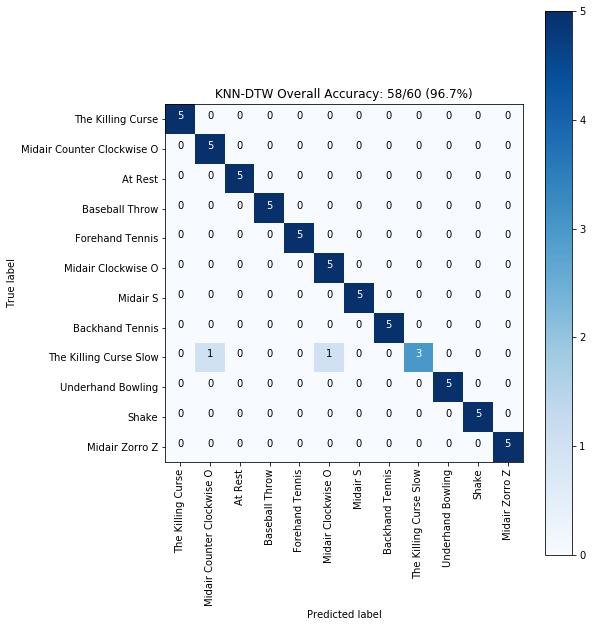

In [31]:
numFolds = 5
shapematching = ShapeMatching('./haoliGestureLogs', numFolds)
shapematching.runKNNDTW()

## Shape-Matching of Jon's Data

Found 100 csv files in ./JonGestureLogs
Found 10 gestures
Found 5 trials for 'Backhand Tennis'
Found 5 trials for 'Midair Clockwise O'
Found 5 trials for 'At Rest'
Found 5 trials for 'Midair Zorro Z'
Found 5 trials for 'Shake'
Found 5 trials for 'Underhand Bowling'
Found 5 trials for 'Midair S'
Found 5 trials for 'Midair Counter Clockwise O'
Found 5 trials for 'Baseball Throw'
Found 5 trials for 'Forehand Tennis'
Max trial length across all gesture is 'At Rest' Trial 3 with 323 sensor events. Resizing all arrays to match
fold: 1


/anaconda3/lib/python3.6/site-packages/scipy/stats/stats.py:245: RuntimeWarning: The input array could not be properly checked for nan values. nan values will be ignored.
  "values. nan values will be ignored.", RuntimeWarning)


fold: 2
fold: 3
fold: 4
fold: 5
KNN-DTW Overall Accuracy: 47/50 (94.0%)
Backhand Tennis 5/5 (100.0%)
Midair Clockwise O 5/5 (100.0%)
At Rest 4/5 (80.0%)
Midair Zorro Z 5/5 (100.0%)
Shake 5/5 (100.0%)
Underhand Bowling 5/5 (100.0%)
Midair S 3/5 (60.0%)
Midair Counter Clockwise O 5/5 (100.0%)
Baseball Throw 5/5 (100.0%)
Forehand Tennis 5/5 (100.0%)

Confusion matrix, without normalization


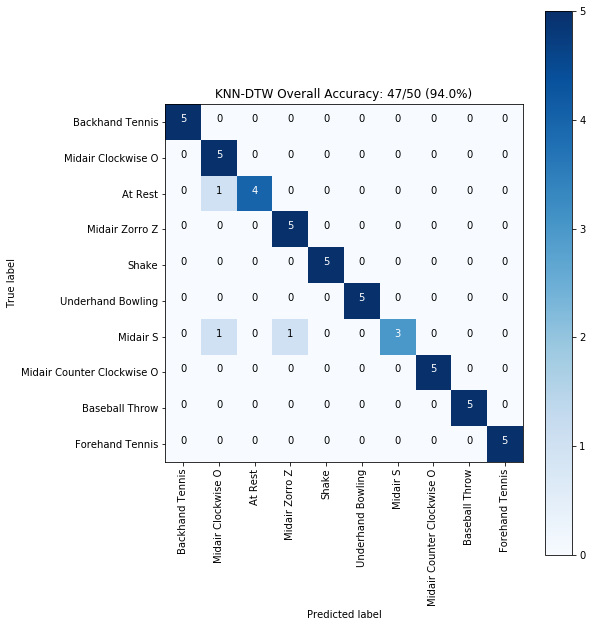

In [32]:
numFolds = 5
shapematching = ShapeMatching('./JonGestureLogs', numFolds)
shapematching.runKNNDTW()

## Shape-Matching of Combined Gestureset

Found 240 csv files in ./allGestureLogs
Found 12 gestures
Found 10 trials for 'Backhand Tennis'
Found 10 trials for 'The Killing Curse'
Found 10 trials for 'The Killing Curse Slow'
Found 10 trials for 'Midair Counter Clockwise O'
Found 10 trials for 'Midair Clockwise O'
Found 10 trials for 'At Rest'
Found 10 trials for 'Midair Zorro Z'
Found 10 trials for 'Shake'
Found 10 trials for 'Baseball Throw'
Found 10 trials for 'Underhand Bowling'
Found 10 trials for 'Forehand Tennis'
Found 10 trials for 'Midair S'
Max trial length across all gesture is 'At Rest' Trial 3 with 323 sensor events. Resizing all arrays to match
fold: 1


/anaconda3/lib/python3.6/site-packages/scipy/stats/stats.py:245: RuntimeWarning: The input array could not be properly checked for nan values. nan values will be ignored.
  "values. nan values will be ignored.", RuntimeWarning)


fold: 2
fold: 3
fold: 4
fold: 5
fold: 6
fold: 7
fold: 8
fold: 9
fold: 10
KNN-DTW Overall Accuracy: 113/120 (94.2%)
Backhand Tennis 9/10 (90.0%)
The Killing Curse 10/10 (100.0%)
The Killing Curse Slow 8/10 (80.0%)
Midair Counter Clockwise O 10/10 (100.0%)
Midair Clockwise O 9/10 (90.0%)
At Rest 9/10 (90.0%)
Midair Zorro Z 10/10 (100.0%)
Shake 10/10 (100.0%)
Baseball Throw 10/10 (100.0%)
Underhand Bowling 10/10 (100.0%)
Forehand Tennis 10/10 (100.0%)
Midair S 8/10 (80.0%)

Confusion matrix, without normalization


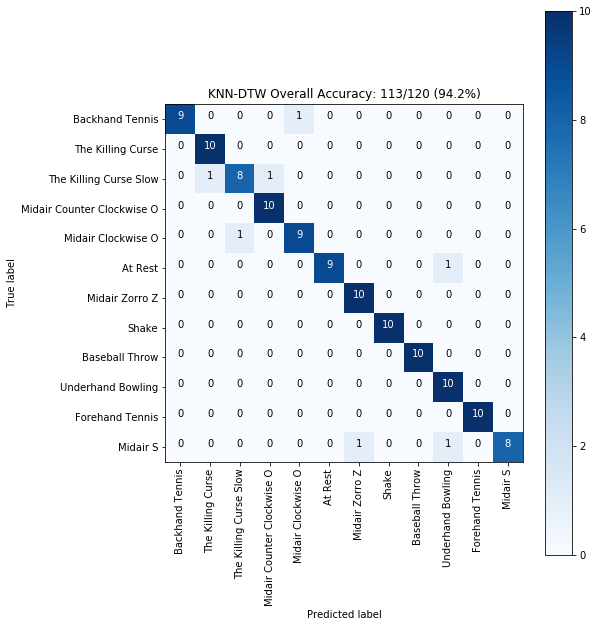

In [33]:
numFolds = 10
shapematching = ShapeMatching('./allGestureLogs', numFolds)
shapematching.runKNNDTW()

# Model-Based Gesture Recognition Approach
- my data
- jon's data
- combined data

## Class Definition

In [25]:
# Here's some sample code for building up a multi-dimensional feature vector
# Feel free to use this approach (or not) in your homework
import random


class ModelBased():
    def __init__(self, log_path, num_folds):
        self.my_logpath = log_path
        self.numFolds = num_folds
        self.mapGestureToTrials = parse_and_create_gesture_trials(self.my_logpath)


    def generate_kfolds(self, mapGestureToTrials, numFolds, createNewKFold=True):
        # Quick check to make sure that there are numFolds of gesture trials for each gesture
        for gestureName, trials in mapGestureToTrials.items():
            if numFolds != len(trials):
                raise ValueError("For the purposes of this assignment, the number of folds={} must equal the number of trials for each gesture. Gesture '{}' has {} trials"
                                 .format(numFolds, gestureName, len(trials)))

        
        numGestures = len(mapGestureToTrials)
        tmpMapGestureToTrials = dict()
        for gestureName, trials in mapGestureToTrials.items():
            tmpMapGestureToTrials[gestureName] = list(trials)

        gestureNames = list(mapGestureToTrials.keys())

        # create folds
        foldToMapGestureToTrial = list()
        for i in range(0, numFolds):
            curFoldMapGestureToTrial = dict()
            foldToMapGestureToTrial.append(curFoldMapGestureToTrial)

            for j in range(0, numGestures):
                curGestureName = gestureNames[j]
                trialList = tmpMapGestureToTrials[curGestureName]
                randTrialIndex = 0
                if (len(trialList) > 0):
                    randTrialIndex = randint(0, len(trialList) - 1)

                randTrial = trialList[randTrialIndex]
                curFoldMapGestureToTrial[curGestureName] = randTrial
                del trialList[randTrialIndex]


        return foldToMapGestureToTrial


    # Example create_feature_vector function that returns a 3D feature vector for the given trial        
    def create_simple_feature_vector(self, trial):
        return [trial.gyro.x.max(), 
                stats.stdev(trial.accel.x), 
                trial.gyro.mag.max()
               ]

    # takes in the current testFold, the trainingFolds, and a create_feature_vector function
    # the create_feature_vector function creates feature vectors given a Trial object
    # I suggest creating multiple different create_feature_vector functions that you pass
    # in here and test (this will allow you to easily compare different feature vectors)
    def get_svm_input(self, testFold, trainingFolds, create_feature_vector):

        # calculate the number of training trials
        numOfTrainingTrials = 0
        for trainingFold in trainingFolds:
            numOfTrainingTrials = numOfTrainingTrials + len(trainingFold)

        # Now figure out the number of features from the create_feature_vector call
        # This is just a dummy call to figure out the number of features in order to
        # properly initialize our trainingData matrix
        tmpTrainingTrial = random.choice(list(trainingFolds[0].values()))
        numFeatures = len(create_feature_vector(tmpTrainingTrial))
    #     print("The feature vector size is: {}".format(numFeatures))

        # now we can setup our training data structures  
        # each row in our trainingData matrix corresponds to a trial
        # and each column corresponds to a feature
        trainingData = np.zeros([numOfTrainingTrials, numFeatures])
        trainingTrials = list()
        trainingLabels = np.array([])

        # Build up the training data and also keep track of the class labels (in trainingLabels)
        row = 0
        for trainingFold in trainingFolds:
            for trainingGestureName, trainingTrial in trainingFold.items():
                trainingData[row] = create_feature_vector(trainingTrial)
                trainingLabels = np.append(trainingLabels, trainingTrial.gestureName)
                trainingTrials.append(trainingTrial)
                row = row + 1


        # Now setup the testData data structure
        testData = np.zeros([len(testFold), numFeatures])
        testRow = 0
        gestureNames = list()
        testTrials = list()
        for testGestureName, testTrial in testFold.items():
            testTrials.append(testTrial)
            testData[testRow] = create_feature_vector(testTrial)
            gestureNames.append(testGestureName)
            testRow = testRow + 1

        return (trainingData, trainingLabels, trainingTrials, testData, gestureNames, testTrials)




    ##### multi-dimentional SVM
    def runMultiSVM(self):
        
        mapGestureToTrials = self.mapGestureToTrials
        numFolds = get_min_num_of_trials(mapGestureToTrials)
        numGestures = len(mapGestureToTrials)
        numTrials = get_total_num_of_trials(mapGestureToTrials)
        foldToMapGestureToTrial = self.generate_kfolds(mapGestureToTrials, self.numFolds)
        gestureNames = list(mapGestureToTrials.keys())
        counts = dict.fromkeys(mapGestureToTrials.keys(), 0)
        allPredictions = []
        allGestureNames = []


        for j in range(len(foldToMapGestureToTrial)):
            # This is an example of how you would call the get_svm_input method
            # You'll have to figre out how to appropriately put this in a for loop and use it...  
            testFold = foldToMapGestureToTrial[j] # select test fold
            trainingFolds = foldToMapGestureToTrial[:j] + foldToMapGestureToTrial[j+1:] # the rest are training folds
            svmInput = self.get_svm_input(testFold, trainingFolds, self.create_simple_feature_vector)

            # Unpack the tuple into more semantic variable names
            trainingData, trainingLabels, trainingTrials, testData, gestureNames, testTrials = svmInput

            ## Training our SVM
            clf = svm.SVC()
            clf.fit(trainingData, trainingLabels) 

            svmPrediction = clf.predict(testData)

            for i in range(len(testData)):
                allPredictions.append(svmPrediction[i])
                allGestureNames.append(gestureNames[i])
                if gestureNames[i] == svmPrediction[i]:
                    counts[gestureNames[i]]+=1

        printAccuracy("{}-D SVM".format(len(trainingData[0])), counts, allGestureNames, allPredictions, gestureNames)


## Model Based Analysis for My Gestureset

Found 120 csv files in ./haoliGestureLogs
Found 12 gestures
Found 5 trials for 'The Killing Curse'
Found 5 trials for 'Midair Counter Clockwise O'
Found 5 trials for 'At Rest'
Found 5 trials for 'Baseball Throw'
Found 5 trials for 'Forehand Tennis'
Found 5 trials for 'Midair Clockwise O'
Found 5 trials for 'Midair S'
Found 5 trials for 'Backhand Tennis'
Found 5 trials for 'The Killing Curse Slow'
Found 5 trials for 'Underhand Bowling'
Found 5 trials for 'Shake'
Found 5 trials for 'Midair Zorro Z'
Max trial length across all gesture is 'At Rest' Trial 4 with 193 sensor events. Resizing all arrays to match
3-D SVM Overall Accuracy: 52/60 (86.7%)
The Killing Curse 5/5 (100.0%)
Midair Counter Clockwise O 3/5 (60.0%)
At Rest 5/5 (100.0%)
Baseball Throw 4/5 (80.0%)
Forehand Tennis 5/5 (100.0%)
Midair Clockwise O 4/5 (80.0%)
Midair S 4/5 (80.0%)
Backhand Tennis 4/5 (80.0%)
The Killing Curse Slow 5/5 (100.0%)
Underhand Bowling 5/5 (100.0%)
Shake 5/5 (100.0%)
Midair Zorro Z 3/5 (60.0%)

Confusi

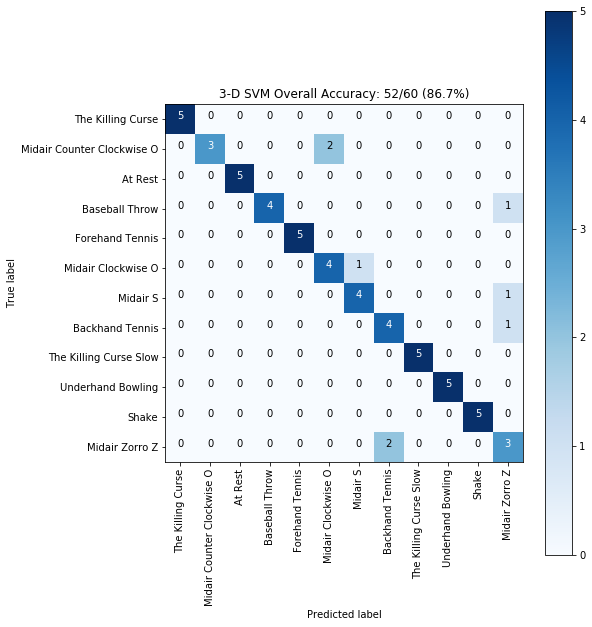

In [26]:
numFolds = 5
multimodel = ModelBased('./haoliGestureLogs', numFolds)
multimodel.runMultiSVM()

## Model Based Analysis of Jon's  Gestureset

Found 100 csv files in ./JonGestureLogs
Found 10 gestures
Found 5 trials for 'Backhand Tennis'
Found 5 trials for 'Midair Clockwise O'
Found 5 trials for 'At Rest'
Found 5 trials for 'Midair Zorro Z'
Found 5 trials for 'Shake'
Found 5 trials for 'Underhand Bowling'
Found 5 trials for 'Midair S'
Found 5 trials for 'Midair Counter Clockwise O'
Found 5 trials for 'Baseball Throw'
Found 5 trials for 'Forehand Tennis'
Max trial length across all gesture is 'At Rest' Trial 3 with 323 sensor events. Resizing all arrays to match
3-D SVM Overall Accuracy: 38/50 (76.0%)
Backhand Tennis 5/5 (100.0%)
Midair Clockwise O 4/5 (80.0%)
At Rest 5/5 (100.0%)
Midair Zorro Z 5/5 (100.0%)
Shake 5/5 (100.0%)
Underhand Bowling 2/5 (40.0%)
Midair S 2/5 (40.0%)
Midair Counter Clockwise O 4/5 (80.0%)
Baseball Throw 4/5 (80.0%)
Forehand Tennis 2/5 (40.0%)

Confusion matrix, without normalization


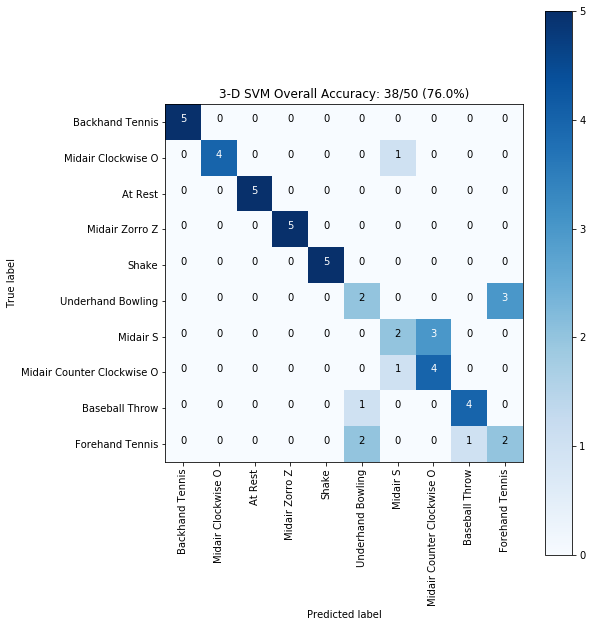

In [27]:
numFolds = 5
multimodel = ModelBased('./JonGestureLogs', numFolds)
multimodel.runMultiSVM()

# Model Based Analysis for Combined Gestureset

Found 240 csv files in ./allGestureLogs
Found 12 gestures
Found 10 trials for 'Backhand Tennis'
Found 10 trials for 'The Killing Curse'
Found 10 trials for 'The Killing Curse Slow'
Found 10 trials for 'Midair Counter Clockwise O'
Found 10 trials for 'Midair Clockwise O'
Found 10 trials for 'At Rest'
Found 10 trials for 'Midair Zorro Z'
Found 10 trials for 'Shake'
Found 10 trials for 'Baseball Throw'
Found 10 trials for 'Underhand Bowling'
Found 10 trials for 'Forehand Tennis'
Found 10 trials for 'Midair S'
Max trial length across all gesture is 'At Rest' Trial 3 with 323 sensor events. Resizing all arrays to match
3-D SVM Overall Accuracy: 92/120 (76.7%)
Backhand Tennis 8/10 (80.0%)
The Killing Curse 8/10 (80.0%)
The Killing Curse Slow 8/10 (80.0%)
Midair Counter Clockwise O 7/10 (70.0%)
Midair Clockwise O 8/10 (80.0%)
At Rest 10/10 (100.0%)
Midair Zorro Z 5/10 (50.0%)
Shake 10/10 (100.0%)
Baseball Throw 8/10 (80.0%)
Underhand Bowling 6/10 (60.0%)
Forehand Tennis 7/10 (70.0%)
Midair S 

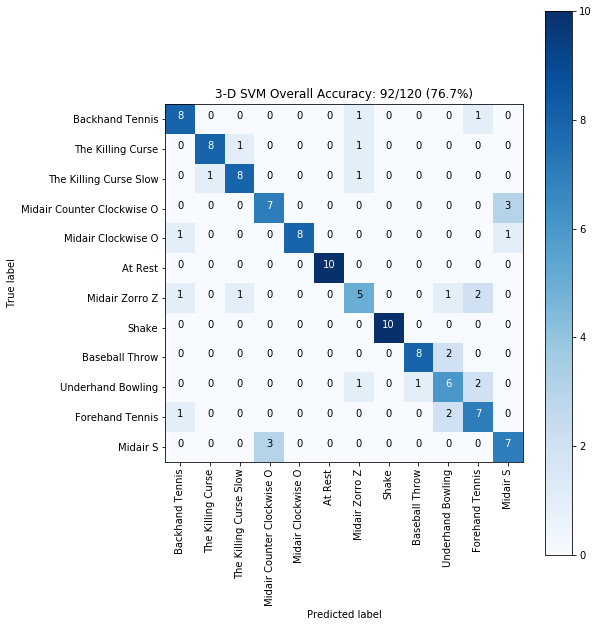

In [28]:
numFolds = 10
multimodel = ModelBased('./allGestureLogs', numFolds)
multimodel.runMultiSVM()

Report
===

# Shape-Matching Approach
I used KNN-DTW as my shape matching approach. I used `KNeighborsTimeSeriesClassifier` from `tslear` package.

## Overall accuracy
For the combined gesture set, the overall accuracy is 92.5% (111 out of 120)
## Per gesture Accuracy

Backhand Tennis 8/10 (80.0%)

The Killing Curse 10/10 (100.0%)

The Killing Curse Slow 7/10 (70.0%)

Midair Counter Clockwise O 10/10 (100.0%)

Midair Clockwise O 9/10 (90.0%)

At Rest 9/10 (90.0%)

Midair Zorro Z 10/10 (100.0%)

Shake 10/10 (100.0%)

Baseball Throw 10/10 (100.0%)

Underhand Bowling 10/10 (100.0%)

Forehand Tennis 10/10 (100.0%)

Midair S 8/10 (80.0%)

## Confusion Matrix
confusion_matrix_for_shape_matching.png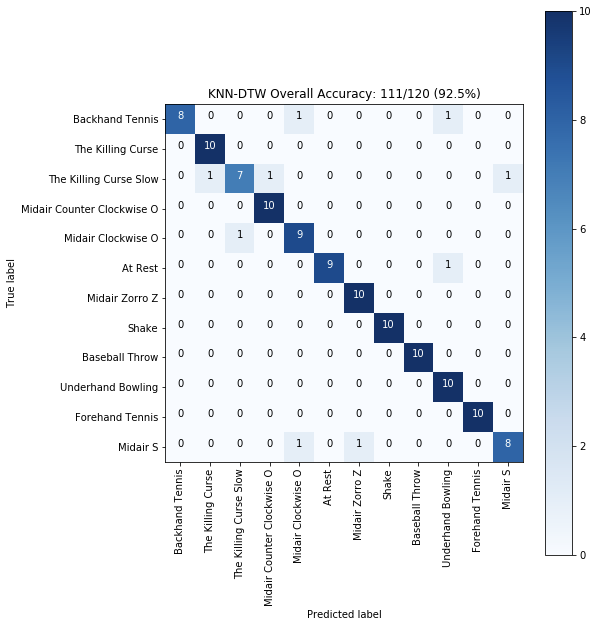


# Model-Based Approach
I used a 3-dimentional SVM for model-based approach. The features I chose was `gyro.x.max()`, `stdev(trial.accel.x)` and `gyro.mag.max()`
## Overall accuracy
For the combined gesture set, the overall accuracy is 75% (90 out of 120)

## Per gesture Accuracy
Backhand Tennis 8/10 (80.0%)

The Killing Curse 7/10 (70.0%)

The Killing Curse Slow 8/10 (80.0%)

Midair Counter Clockwise O 7/10 (70.0%)

Midair Clockwise O 8/10 (80.0%)

At Rest 10/10 (100.0%)

Midair Zorro Z 5/10 (50.0%)

Shake 10/10 (100.0%)

Baseball Throw 8/10 (80.0%)

Underhand Bowling 6/10 (60.0%)

Forehand Tennis 6/10 (60.0%)

Midair S 7/10 (70.0%)

## Confusion Matrix
![Confusion Matrix of Model-Based Approach](./confusion_matrix_for_model_based.png)

# Key Challenges

- make shape-matching algorithm work
- conplete k-fold validation
- borrow an Android phone from my friend, many times

# What I learned
## Start Early
It's always good to take a look at the assignment as soon as possible and get a general idea of what need to be done

## Think Before Type
With the ambiguity and some lack of scaffolding, it is critical to think and make out a plan first. This could result in less typing and shorter time spend sitting and typing, thus reducing the risk of getting a muscule knot in the back (lol).

## There is still so much to do
Although this assignment helped me gain some experience in dealing with real world, less scaffolded problem, there was still room of improvement in my approach, and could be applied to more real world problems. Data preprocessing, transformation, etc., are some things to keep in mind while solving future problems.
